# E10-3: A multi-resolution sinusoidal model

In this exercise you will implement a multi-resolution sine model by modifying the `sineModel()` function. 

You have seen through several assignments that the choice of window size is an important tradeoff between time and frequency resolution. Longer windows have a better frequency resolution and can resolve two close sinusoids even at low frequencies, while smaller windows have a better time resolution leading to sharper onsets. So far, in all the analyses, we have only considered a single window length over the whole sound. As we know, analysis of signals with low frequency components needs longer windows as compared to signals with high frequency content. The optimal choice of window length is thus dependent on the frequency content of the signal. In other words, it is better to choose a longer window for the analysis of the low frequencies while a shorter window is sufficient for higher frequencies. In this exercise, you will explore the use of multiple window sizes for analysis in different frequency bands of the signals, what is called multi-resolution.

For each audio frame of `x` you should compute three different DFTs with three different window sizes and find the sinusoidal peaks for each of the DFTs. For example, you can choose window sizes `M1 = 4095, M2 = 2047, M3 = 1023`, to generate three windows w1, w2, w3. Choose N1, N2, N3 to be the power of two bigger than the corresponding window size. Then compute the spectra, `X1`, `X2`, and `X3` using `dftAnal()`. Define the frequency bands like `B1: 0 <= f < 1000Hz, B2: 1000 <= f < 5000, B3: 5000 <= f < 22050` and find the peaks of `B1` in `X1`, the ones of `B2` in `X2`, and the ones of `B3` in `X3`. From the peaks we finally re-synthesize the frame and generate the output `y`. 

Complete `sineModelMultiRes()`, by copiying and modifying the code from `SineModel()`. The functions should take as input three windows with different sizes, three FFT sizes, and the values for the frequency bands. Write the code to implement the multi-resolution analysis as described above.

Choose two different polyphonic recordings from freesound that have both a relevant melodic and percussion components. Edit them and change their format as needed. Choose suitable set of parameters for their analysis. Experiment with different window sizes and fruequency bands for the two sounds such that you get both crisp onsets and good frequency resolution. Get the best posible base line reconstruction with `SineModel()` and the best with `sineModelMultiRes()`. Listen the sounds and visualize the information that might be needed to undertand the process. 

Your explanation should include:

1. Freesound link to the two sounds chosen.
2. Explanation and justification of the band edges and the window sizes for each sound.
3. Observations about the advantages of a multi-resolution analysis (comment on the time-frequency resolution, computational complexity and extensions to HPR and HPS models).
4. Challenges you might face if you were to extend it to HPR and HPS models (mainly in sinusoid tracking and F0 estimation).
5. Further methods to improving the time-frequency resolution trade-off. 


In [25]:
import sys, os
from scipy.signal import get_window
import numpy as np
from scipy.signal import blackmanharris, triang
from scipy.fftpack import ifft, fftshift
import math
sys.path.append('../software/models/')
import dftModel as DFT
import stft as STFT
import utilFunctions as UF
import dftModel as DFT
import utilFunctions as UF
import sineModel as SM
import IPython.display as ipd
import matplotlib.pyplot as plt

In [26]:
def sineModelMultiRes(x, fs, W, N, t, B):
    """
    Analysis/synthesis of a sound using the sinusoidal model, without sine tracking
    Inputs:
        x: input array sound
        w: 3 analysis windows
        t: threshold in negative dB 
        B: 3 frequency boundaries
    Output:
        y: output array sound
    """
 
### your code here, start from copying the code from sineModel()       
            
    Ns = 512                                                # FFT size for synthesis (even)
    H = Ns//4                                               # Hop size used for analysis and synthesis
    hNs = Ns//2                                             # half of synthesis FFT size
    yw = np.zeros(Ns)                                       # initialize output sound frame
    y = np.zeros(x.size)                                    # initialize output array
    sw = np.zeros(Ns)                                       # initialize synthesis window
    ow = triang(2*H)                                        # triangular window
    sw[hNs-H:hNs+H] = ow                                    # add triangular window
    bh = blackmanharris(Ns)                                 # blackmanharris window
    bh = bh / sum(bh)                                       # normalized blackmanharris window
    sw[hNs-H:hNs+H] = sw[hNs-H:hNs+H] / bh[hNs-H:hNs+H]     # normalized synthesis window
    
    # -------------------------------------- For loop start -------------------------------------------------- #
    for i in range (0,B.size-1):
        
        print(f"Iteration {i+1}: {B[i]}Hz - {B[i+1]}Hz")
        
        hM1 = int(math.floor(W[i].size+1)/2)                    # half analysis window size by rounding
        hM2 = int(math.floor(W[i].size/2))                      # half analysis window size by floor
        
        w = W[i]/sum(W[i])                                   # normalize analysis window 

        pin = max(hNs, hM1)                                     # init sound pointer in middle of anal window       
        pend = x.size - max(hNs, hM1)                           # last sample to start a frame
        
        # -------------------------------------- While loop start ---------------------------------------------- #
        while pin<pend:

            #-----analysis-----#             
            x1 = x[pin-hM1:pin+hM2]                               # select frame
            mX, pX = DFT.dftAnal(x1, w, N[i])                        # compute dft     

            ploc = UF.peakDetection(mX, t)                        # detect locations of peaks
            iploc, ipmag, ipphase = UF.peakInterp(mX, pX, ploc)   # refine peak values by interpolation
            ipfreq = fs*iploc/float(N[i])                         # convert peak locations to Hertz

            # Identification of frequencies for each band
            if(len(np.where(B[i]<ipfreq)[0] > 0)):        #identify first frequency of the band in the array (ilow)
                ilow = min(np.where(B[i]<ipfreq)[0])
            else:
                ilow = 0                                
                
            if(len(np.where(B[i+1]>ipfreq)[0] > 0)):      #identify last frequency of the band in the array (ihigh)
                ihigh = max(np.where(B[i+1]>ipfreq)[0])+1 
            else:
                ihigh = 0
            
            # Read only frequencies, magnitudes and phases of the band
            ipfreq = ipfreq[ilow:ihigh]
            ipmag = ipmag[ilow:ihigh]
            ipphase = ipphase[ilow:ihigh]  
        
            #-----synthesis-----#
            Y = UF.genSpecSines(ipfreq, ipmag, ipphase, Ns, fs)   # generate sines in the spectrum  
            fftbuffer = np.real(ifft(Y))                          # compute inverse FFT
            yw[:hNs-1] = fftbuffer[hNs+1:]                        # undo zero-phase window
            yw[hNs-1:] = fftbuffer[:hNs+1] 
            y[pin-hNs:pin+hNs] += sw*yw                           # overlap-add and apply a synthesis window
            pin += H                                              # advance sound pointer
        
        # -------------------------------------- While loop end ---------------------------------------------- #

    # ---------------------------------------- For loop end -------------------------------------------------- #    
    return y


#### Multiresolution operation

How this algorithm basicaly works at a high level it is shown schematically in the image. For each window size we take the information of the specific band for its specific time resolution (marked in black). 

file:///home/jbs/Shared/Captura.JPG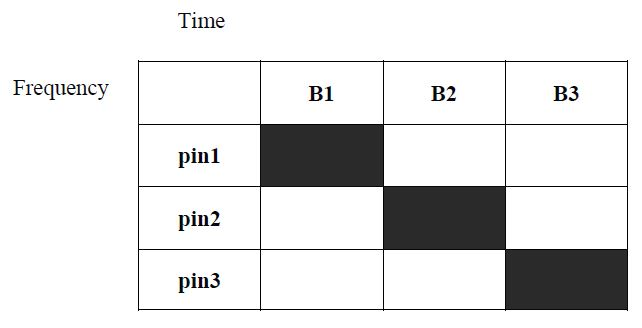

# Your explanation



## 1) Freesound Links

Sound 1: https://freesound.org/people/jbs_06/sounds/496174/

Sound 2: https://freesound.org/people/FrankyBoomer/sounds/261100/



## 2) Explanation and justification of the band edges and the window sizes for each sound.
To explain and justify the band edges and window size first an analysis with the STFT is applied. Then the Sine Model and the Multiresolution Sine Model. Finally a comparison between both models is shown. 

### SOUND 1:

#### 1) Analysis of the sound: time and frequency resolution.

- With waveform we can appreciate that high **time resolution** is needed because of the presence of percussive elements with fast attacks (kick and hihats). Therefore a good time resolution is needed to capture the transients.

- About **frequency spectrum** we have to focus on low frequencies because of our frequency scale perception. Taking a look to the zoom spectrum we realised that a good frequency resolution is needed to synthesize the original pitch for the kick and the synthesizer that is playing the melody.

Therefore, this sound is challenging because of the neccesity of high time resolution for the kick and the hihat and high frequency resolution for the kick and the synthesizer

(376, 4097)


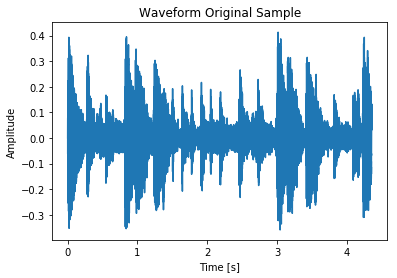

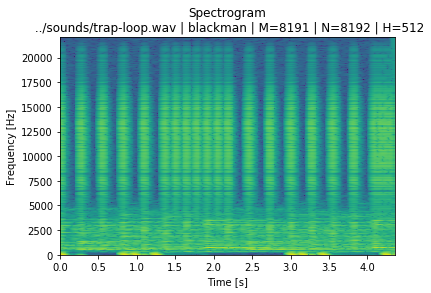

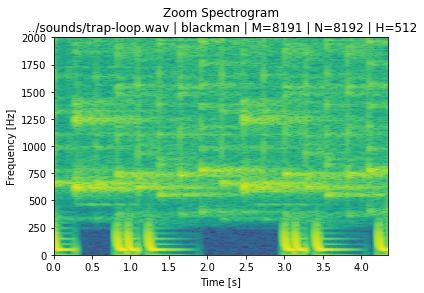

In [27]:
# ANALYSIS OF THE SOUND: Plotting signal and STFT
input_file = '../sounds/trap-loop.wav'
M = 8191
N = 8192
t = -100
H = 512
window = 'blackman'

fs, x = UF.wavread(input_file) 
w = get_window(window, M) 

# ------------- Time Analysis -----------------#
t = np.arange(x.size)/fs

plt.figure()
plt.plot(t,x)
plt.title('Waveform Original Sample')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

# ------------- Frequency Analysis -----------------#
mX, pX = STFT.stftAnal(x,w,N,H)
print(mX.shape)

t = H*np.arange(int(mX[:,0].size))/fs
f = np.arange(N/2+1)*fs/N

plt.figure()
plt.title(f'Spectrogram\n {input_file} | {window} | M={M} | N={N} | H={H}')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.pcolormesh(t,f,np.transpose(mX))

plt.figure()
plt.title(f'Zoom Spectrogram\n {input_file} | {window} | M={M} | N={N} | H={H}')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.ylim(0,2000)
plt.pcolormesh(t,f,np.transpose(mX))

#### 2) Sine Model
To obtain a good synthesis with the sine model, low values of window size and FFT size are chosen. This is because
the good time resolution required in this sample. A lower window size and FFT size could have been chosen but with a window size of 1023 and a FFT size of 1024 the pitch of the kick is distorted. Also, we are loosing part of the transient of the hihats. Blackman window is selected due to less noise introduction. Hamming window obtains less quality in the output in this case. 


In [28]:
# base line sinusoidal analysis/synthesis
### set the parameters
input_file = '../sounds/trap-loop.wav'
M = 2047
N = 2048
t = -100
window = 'blackman'

# no need to change code from here
fs, x = UF.wavread(input_file) 
w = get_window(window, M) 
y_sineModel = SM.sineModel(x, fs, w, N, t)

print("Original Sound")
ipd.display(ipd.Audio(data=x, rate=fs))
print("Sine Model Sound")
ipd.display(ipd.Audio(data=y_sineModel, rate=fs))

Original Sound


Sine Model Sound


**3) Multiresolution model**

**Band 1: 0Hz-800Hz - M=2047 - N=2048**. This band is selected because is where the kick is placed in the frequency spectrum. In order to do a good synthesis of the kick relatively high frequency resolution (to capture the original pitch of the sound) and high time resolution is needed (to capture the fast attack of the kick). That is why 2047 window size (odd to have a simmetrical window) and 2048 FFT are selected. Also part of the synthesizer is placed in this part of the spectrum. This is another reason to use high frequency resolution. Because the synthesizer does not have fast attacks or fast melodies we should not worry about time resolution.

**Band 2: 800Hz-3000Hz - M=1023 - N=1024**. The synthesizer and part of the attack of the kick are placed here. Therefore we should worry about time resolution. So a relatively low time resolution is chosen.


**Band 3: 3000Hz-20050Hz - M=511 - N=512**. The hihat is place in this part of the spectrum. To capture the attack of the hihats high time resolution is needed. Also due to our frequency perception resolution at high frequencies is poorer than at low frequencies a lower frequency resolution is needed. Therefore a window size of 511 and a FFT size of 512 is selected.

In [29]:
# multiresolution sinusoidal analysis/synthesis
### set the parameters
input_file = '../sounds/trap-loop.wav'
M = np.array([2047,1023,511])
N = np.array([2048,1024,512])
B = np.array([0,800,3000,20050])
t = -100
window = 'blackman'

fs, x = UF.wavread(input_file) 

w = []
for i in range (M.size):
    win = get_window(window, M[i])
    w.append(win)
    

# no need to change code from here
y_multiresolution = sineModelMultiRes(x, fs, w, N, t, B)

print("Original Sound")
ipd.display(ipd.Audio(data=x, rate=fs))
print("Multiresolution Sine Model Sound")
ipd.display(ipd.Audio(data=y_multiresolution, rate=fs))


Iteration 1: 0Hz - 800Hz
Iteration 2: 800Hz - 3000Hz
Iteration 3: 3000Hz - 20050Hz
Original Sound


Multiresolution Sine Model Sound


**4) Comparison**

**Sound comparison**: Listening to the samples of the Sine Model and the Multiresolution model we can highlight how the Multiresolution model achieve to capture the pitch of the original kick and synthesizer and is also able to capture the attacks of the hihats better than the Sinusoidal Model. However, because part of the transients from the kick are place in the middle band (800Hz-3000Hz) and a relatively high window size is selected (because we also need good frequency resolution for the synthesizer) 

**Plot comparison**: We can also appreciate how the transients are captured better by the Multiresolution model with the graphs plotted below. Especially in the last plot where the three samples are plotted and zoomed.

**SNR comparison**: we can appreciate that the SNR of both models are similar however we have to highlight that the Multiresolution model obtains a slightly higher SNR taking less samples than the Sine Model. This is due to how low window size allows to capture fast transients because the increased of the time resolution.


Original Sound


Sine Model Sound


Multiresolution Sine Model Sound


SNR Sinusoidal Model: 10.55167642810491
SNR Multiresolution Model: 10.77616330586713


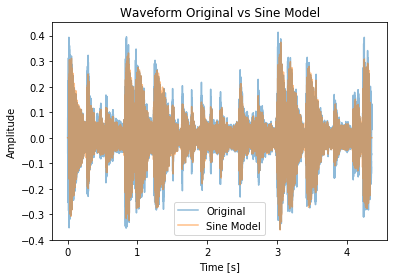

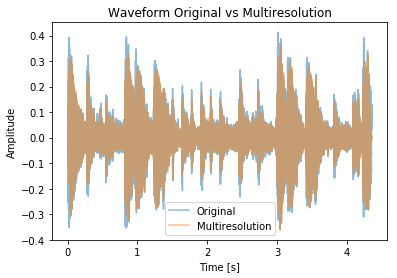

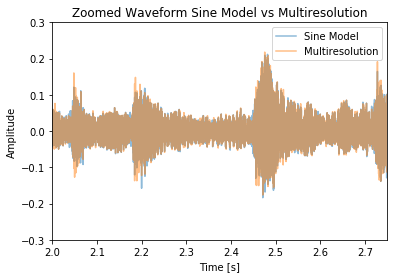

In [31]:
# ---------------------------- Sound Comparison -------------------------------#
print("Original Sound")
ipd.display(ipd.Audio(data=x, rate=fs))
print("Sine Model Sound")
ipd.display(ipd.Audio(data=y_sineModel, rate=fs))
print("Multiresolution Sine Model Sound")
ipd.display(ipd.Audio(data=y_multiresolution, rate=fs))

# ---------------------------- Plot Comparison --------------------------------#
t = np.arange(x.size)/fs

plt.figure()
plt.plot(t,x,alpha = 0.5)
plt.plot(t,y_sineModel,alpha = 0.5)
plt.title("Waveform Original vs Sine Model")
plt.legend(('Original','Sine Model','Multiresolution'))
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.figure()
plt.plot(t,x,alpha = 0.5)
plt.plot(t,y_multiresolution,alpha = 0.5)
plt.title("Waveform Original vs Multiresolution")
plt.legend(('Original','Multiresolution'))
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.figure()
plt.plot(t,y_sineModel,alpha = 0.5)
plt.plot(t,y_multiresolution,alpha = 0.5)
plt.xlim(2,2.75)
plt.ylim(-0.3,0.3)
plt.title("Zoomed Waveform Sine Model vs Multiresolution")
plt.legend(('Sine Model','Multiresolution'))
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

# ---------------------------- SNR Sine Model --------------------------------#
noise = x - y_sineModel

E_noise = sum(np.multiply(noise,noise))    
E_signal = sum(np.multiply(y_sineModel,y_sineModel))
    
snr = 10*np.log10(E_signal/E_noise)

print(f"SNR Sinusoidal Model: {snr}")


# ----------------------- SNR Multiresolution Model ---------------------------#

noise = x - y_multiresolution

E_noise = sum(np.multiply(noise,noise))    
E_signal = sum(np.multiply(y_multiresolution,y_multiresolution))
    
snr = 10*np.log10(E_signal/E_noise)

print(f"SNR Multiresolution Model: {snr}")

### SOUND 2:

#### 1) Analysis of the sound: time and frequency resolution.

- With the waveform of the sample we can appreciate that we need high **time resolution**. Transients from the hihats, the percussive part of the piano and the fast attack of the double bass being pressed need to be captured. Also the fast melody that the piano plays requires high time resolution (but not as critical as the time resolution needed to capture the transients of the three instruments)

- About **frequency spectrum** analyzing the low frequencies we observed that high frequency resolution at low frequencies is needed in order to capture the pitch of the bass. High frequencies are not critical because of our perceptive frequency scale.

Therefore, this sound is challenging because of the neccesity of high time resolution for the kick and the hihat and high frequency resolution for the kick and the synthesizer

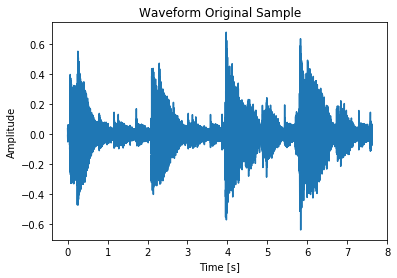

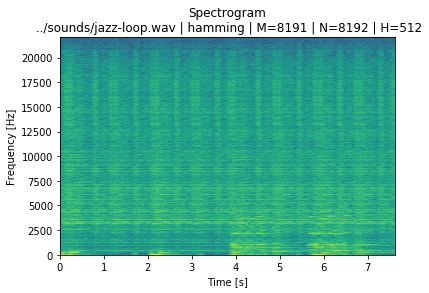

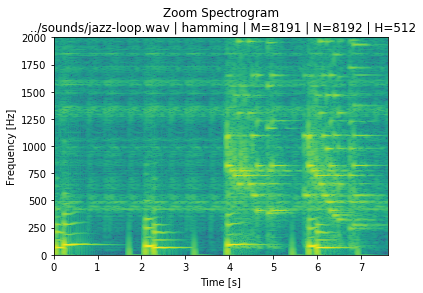

In [32]:
# ANALYSIS OF THE SOUND: Plotting signal and STFT
input_file = '../sounds/jazz-loop.wav'
M = 8191
N = 8192
t = -100
H = 512
window = 'hamming'

fs, x = UF.wavread(input_file) 
w = get_window(window, M) 

# ------------- Time Analysis -----------------#
t = np.arange(x.size)/fs

plt.figure()
plt.plot(t,x)
plt.title('Waveform Original Sample')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

# ------------- Frequency Analysis -----------------#
mX, pX = STFT.stftAnal(x,w,N,H)

t = H*np.arange(int(mX[:,0].size))/fs
f = np.arange(N/2+1)*fs/N

plt.figure()
plt.title(f'Spectrogram\n {input_file} | {window} | M={M} | N={N} | H={H}')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.pcolormesh(t,f,np.transpose(mX))

plt.figure()
plt.title(f'Zoom Spectrogram\n {input_file} | {window} | M={M} | N={N} | H={H}')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.ylim(0,2000)
plt.pcolormesh(t,f,np.transpose(mX))

#### 2) Sine Model
To obtain a good synthesis with the sine model, 2047 of window size and 2048 of FFT size is selected to have a good time-frequency resolution trade-off. In order to capture correctly the transients of the instruments and  the pitch of the double bass. Blackman window is chosen due to its high SNR. Threshold value of -100dB allows to capture the signals for a good synthesis of the sound.

In [33]:
# base line sinusoidal analysis/synthesis
### set the parameters
input_file = '../sounds/jazz-loop.wav'
M = 2047
N = 2048
t = -100
window = 'blackman'

# no need to change code from here
fs, x = UF.wavread(input_file) 
w = get_window(window, M) 
y_sineModel = SM.sineModel(x, fs, w, N, t)

print("Original Sound")
ipd.display(ipd.Audio(data=x, rate=fs))
print("Sine Model Sound")
ipd.display(ipd.Audio(data=y_sineModel, rate=fs))

Original Sound


Sine Model Sound


**3) Multiresolution model**

**Band 1: 0Hz-500Hz - M=2047 - N=2048**. This band is selected because is where the double bass is placed in the spectrum. Due to the necesity of high frequency resolution (to capture the original pitch of the sample) but also a relatively high resolution of time (to capture the attack of the instrument) values of 2047 for M and 2048 for N are selected.

**Band 2: 500Hz-3000Hz - M=1023 - N=1024**. In this location of the spectrum the piano is placed with the transients of the double bass and part of the hihats. To capture these transients a lower M and N are introduced. However, this values allow to capture the pitch of the piano satisfactorily.


**Band 3: 3000Hz-20050Hz - M=511 - N=512**. The hihat is place in this part of the spectrum. To capture part of the attack of the hihats high time resolution is needed. Also due to our frequency perception resolution at high frequencies is poorer than at low frequencies a lower frequency resolution is needed. Therefore a window size of 511 and a FFT size of 512 is selected.

In [34]:
# multiresolution sinusoidal analysis/synthesis
### set the parameters
input_file = '../sounds/jazz-loop.wav'
M = np.array([2047,1023,511])
N = np.array([2048,1024,512])
B = np.array([0,500,3000,20050])
t = -100
window = 'blackman'

fs, x = UF.wavread(input_file) 

w = []
for i in range (M.size):
    win = get_window(window, M[i])
    w.append(win)

    

# no need to change code from here
y_multiresolution = sineModelMultiRes(x, fs, w, N, t, B)

print("Original Sound")
ipd.display(ipd.Audio(data=x, rate=fs))
print("Multiresolution Sine Model Sound")
ipd.display(ipd.Audio(data=y_multiresolution, rate=fs))

Iteration 1: 0Hz - 500Hz
Iteration 2: 500Hz - 3000Hz
Iteration 3: 3000Hz - 20050Hz
Original Sound


Multiresolution Sine Model Sound


**4) Comparison**

**Sound comparison**:Listening to the samples of the Sine Model and the Multiresolution model we can highlight how the Multiresolution model achieve , listening carefully, to capture the attack of the piano better. The attack of the hihats and the double bass is also well captured by Sine Model. 

**Plot comparison**:We can appreciate this in the last graph. From 3.8s to 4.8s the first quick melody of the piano is played and we can appreciate how the Multiresolution Model has higher voltage values in the attacks of the piano. It needs to be mentioned that this difference is very small but it can be appreciate it by listen to both samples carefully.

**SNR comparison**: As mentioned in the first sound, we can appreciate that the SNR of both models are similar however we have to highlight that the Multiresolution model obtains a slightly higher SNR taking less samples than the Sine Model. This is due to how low window size allows to capture fast transients because the increased of the time resolution.

Original Sound


Sine Model Sound


Multiresolution Sine Model Sound


SNR Sinusoidal Model: 16.044996063677544
SNR Multiresolution Model: 16.05659489705568


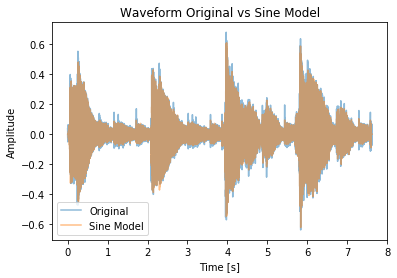

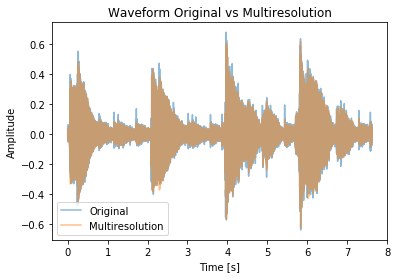

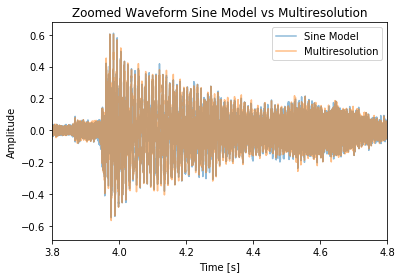

In [36]:
# ---------------------------- Sound Comparison -------------------------------#
print("Original Sound")
ipd.display(ipd.Audio(data=x, rate=fs))
print("Sine Model Sound")
ipd.display(ipd.Audio(data=y_sineModel, rate=fs))
print("Multiresolution Sine Model Sound")
ipd.display(ipd.Audio(data=y_multiresolution, rate=fs))

# ---------------------------- Plot Comparison --------------------------------#
t = np.arange(x.size)/fs

plt.figure()
plt.plot(t,x,alpha = 0.5)
plt.plot(t,y_sineModel,alpha = 0.5)
plt.title("Waveform Original vs Sine Model")
plt.legend(('Original','Sine Model','Multiresolution'))
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.figure()
plt.plot(t,x,alpha = 0.5)
plt.plot(t,y_multiresolution,alpha = 0.5)
plt.title("Waveform Original vs Multiresolution")
plt.legend(('Original','Multiresolution'))
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.figure()
plt.plot(t,y_sineModel,alpha = 0.5)
plt.plot(t,y_multiresolution,alpha = 0.5)
plt.xlim(3.8,4.8)
plt.title("Zoomed Waveform Sine Model vs Multiresolution")
plt.legend(('Sine Model','Multiresolution'))
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

# ---------------------------- SNR Sine Model --------------------------------#
noise = x - y_sineModel

E_noise = sum(np.multiply(noise,noise))    
E_signal = sum(np.multiply(y_sineModel,y_sineModel))
    
snr = 10*np.log10(E_signal/E_noise)

print(f"SNR Sinusoidal Model: {snr}")


# ----------------------- SNR Multiresolution Model ---------------------------#

noise = x - y_multiresolution

E_noise = sum(np.multiply(noise,noise))    
E_signal = sum(np.multiply(y_multiresolution,y_multiresolution))
    
snr = 10*np.log10(E_signal/E_noise)

print(f"SNR Multiresolution Model: {snr}")

## 3) Observations about the advantages of a multi-resolution analysis (comment on the time-frequency resolution, computational complexity and extensions to HPR and HPS models).

**- Time-frequency resolution:** the main advantage of a multiresoulution algorithm is that we can achive better time resolution in one part of the spectrum, a better frequency resolution in an other part and both high time-frequency resolution in an other, based on the window size of each band. This works fine for songs or samples that have different intruments placed in different places in the frequency spectrum and with different characteristics (attack, transients, ...)that are needed to capture the timbre of the sound. It also helps to adapt the frequency resolution of a sample to human kind frequency resolution, therefore fewer samples could be taken at higher frequencies and therefore less memory would be used. However, to achieve this, a better frequency resolution algorithm should be implemented with more bands than just three.

Something that we have to be aware of is sampling different parts of the sound (in the frequency spectrum) with different time and frequency resolution. If for instance, a part of the kick is sample with a specific time resolution but other important part of the sound of the kick is sampled with a big difference in time-frequency resolution some distorsion may appear in the sound. This can be resolved by chosing the frequency bands based on the part of the spectrum where each sound is. Or taking a larger number of bands to make this different time and frequency resolutions that a same sound may have, smoother.

**-Computational complexity:** the computation complexity increases with a multi-resolution model because the sample has to be analyzed each time we want a different resolution, adding CPU workload. For instance, with this algorithm the sample has to be analyzed three times and therefore the amount of time to process it is approximatly three times higher (depending on the size of the window) for each band.

**- HPR and HPS models:** applying multiresolution to HPR and HPS increaseas the complexity of the algorithm. This fact is mentioned below.

## 4) Challenges you might face if you were to extend it to HPR and HPS models (mainly in sinusoid tracking and F0 estimation).

**Sinusoid tracking**: In the three models: HPS, HPS and Sine Model, sinusoid tracking is required. This can lead to some errors when the sinusoid moves from one band to another. However this error is only significant if the difference of frequency resoluion between the bands is big.

**F0 estimation**: is real challenge. Because the F0 estimation has to be calculated in diiferent bands with different frequency resolutions, a mismatch in the harmonics between harmonics may appear. Therefore to avoid a mismatch, information should be tr To achieve a good F0 estimation further research is needed.

## 5) Further methods to improving the time-frequency resolution trade-off. 
First, paying attention to **frequency resolution**, more frequency bands should added based on our frequency resolution. "Mel Scale" should be consider to model the filter banks in charge of our auditive perception. Therefore 32 bands should be added and fixed to the values that correspond to our filter banks (based on the following table) It needs to be mentioned that this increased in the number of frequency bands would increase the computational complexity.

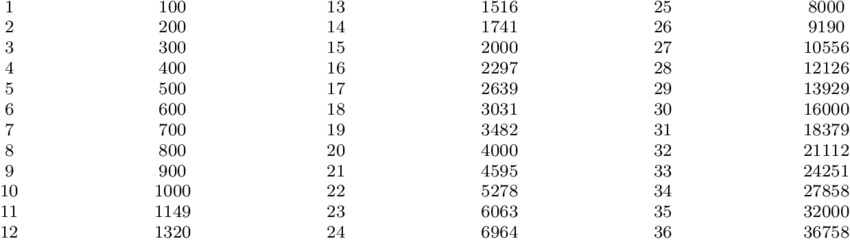

Regarding **time resolution**, multiresolution algorithms should change their time resolution (and therefore frequency resolution) dynamically, adapting the time-frequency resolution to each frame.
To achieve this, the sample should be process before the final processing. A fast onset detection function should be implemented and based on the fast onsets of the sample for each frame, a specific window size should be selected for that frame. 

However if these two ideas would be implemented the time processing will increase a factor: *nº of frequency bands X frames*. For instance, for one of the past sound that had 376 frames this time would increase 376*32 = 12032 times.

